**importing libraries for reading data**

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

**analysis data and preprocessing data**

In [6]:
df=pd.read_csv('data1.csv')
df=df.drop('Unnamed: 5',axis=1)

In [7]:
df.head(5)

,T(t),H(t),P(t),W(t),W(t+3)
0,7.240529,83.0,1009.2,22.644000,22.505674
1,6.620529,83.0,1009.2,25.642298,18.931276
2,6.510529,85.0,1008.1,19.971119,16.687786
3,6.580529,83.0,1007.7,22.505674,7.544342
4,6.700529,84.0,1007.7,18.931276,5.763114


In [8]:
df.describe()

,T(t),H(t),P(t),W(t),W(t+3)
count,4243.000000,4243.000000,4243.000000,4243.000000,4243.000000
mean,5.492141,70.557860,1016.732666,11.285810,11.273353
std,4.564751,14.749796,11.499175,8.038207,8.033885
min,-8.649471,21.000000,985.500000,0.000000,0.000000
25%,2.180529,60.000000,1009.000000,5.172553,5.158796
50%,5.310529,72.000000,1017.000000,9.057600,9.045838
75%,8.560529,82.000000,1024.850000,15.632710,15.597487
max,19.960530,100.000000,1040.100000,52.823162,52.823162


In [9]:
from sklearn import preprocessing
X=df.to_numpy()
x=X[:, :-1]
y=X[:,-1]
for i in range(0,64):
    x = np.delete(x, 4243, 0) 
for i in range(0,64):
  y = np.delete(y, 4243, 0) 
print(len(y))
print(len(x))

4243
4243


wind speed (t+3) / T(t)

Text(0, 0.5, 'W(t+3)')

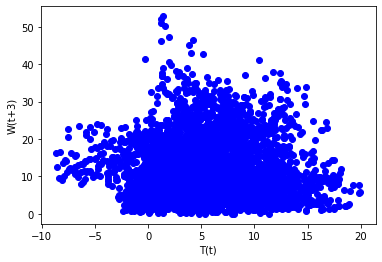

In [10]:
plt.plot(x[0:4243,0],y,'bo')
plt.xlabel('T(t)')
plt.ylabel('W(t+3)')

wind speed (t+3) / H(t)

Text(0, 0.5, 'W(t+3)')

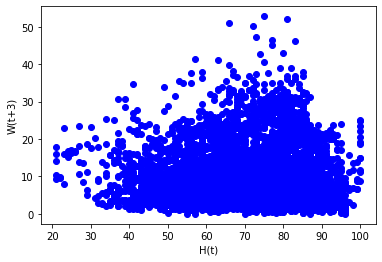

In [18]:
plt.plot(x[0:4243,1],y,'bo')
plt.xlabel('H(t)')
plt.ylabel('W(t+3)')

wind speed (t+3) / P(t)

Text(0, 0.5, 'W(t+3)')

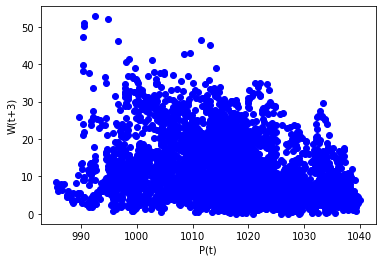

In [19]:
plt.plot(x[0:4243,2],y,'bo')
plt.xlabel('P(t)')
plt.ylabel('W(t+3)')

wind speed (t+3) / W(t)

Text(0, 0.5, 'W(t+3)')

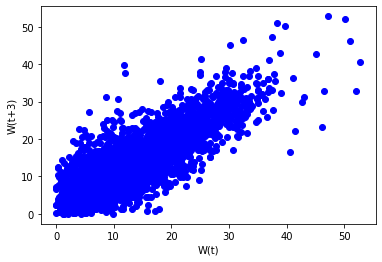

In [20]:
plt.plot(x[0:4243,3],y,'bo')
plt.xlabel('W(t)')
plt.ylabel('W(t+3)')

In [11]:
x=preprocessing.scale(x)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0,shuffle=True)

**Model: Linear Regression**

In [12]:
from sklearn.linear_model import LinearRegression

In [13]:
lr_model=LinearRegression(normalize=True)
lr_model.fit(X_train,y_train)
acc_lr_train=lr_model.score(X_train,y_train)
acc_lr_test=lr_model.score(X_test,y_test)
print('acc lr_train: ',acc_lr_train)
print('acc lr_test: ',acc_lr_test)

acc lr_train:  0.7193957352151736
acc lr_test:  0.7812233982395378


In [14]:
y_predicted_train_lr_model=lr_model.predict(X_train)
y_predicted_test_lr_model=lr_model.predict(X_test)
y_predicted_train_lr_modeln=y_predicted_train_lr_model.reshape(3394,)
y_predicted_test_lr_modeln=y_predicted_test_lr_model.reshape(849,)
fault_y_predicted_train_lr_model=y_predicted_train_lr_modeln-y_train
fault_y_predicted_test_lr_model=y_predicted_test_lr_modeln-y_test
MSE_lr_model_train=mean_squared_error(y_train, y_predicted_train_lr_model)
MSE_lr_model_test=mean_squared_error(y_test, y_predicted_test_lr_model)
print('MSE lr_model train: ',MSE_lr_model_train)
print('MSE lr_model test: ',MSE_lr_model_test)

MSE lr_model train:  17.913391223978376
MSE lr_model test:  14.715511332391078


In [15]:
print('max fault test: ',np.max(np.abs(y_predicted_test_lr_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_lr_model-y_test)))

max fault test:  16.405800902664236
min fault test:  0.0026270811778896785


**Model: Linear Regression PolynomialFeatures**

In [16]:
from sklearn.preprocessing import PolynomialFeatures

In [17]:
x_poly_train=PolynomialFeatures(degree=5).fit_transform(X_train)
x_poly_test=PolynomialFeatures(degree=5).fit_transform(X_test)
lr_model_poly=LinearRegression(normalize=True)
lr_model_poly.fit(x_poly_train,y_train)
acc_lr_poly_train=lr_model_poly.score(x_poly_train,y_train)
acc_lr_poly_test=lr_model_poly.score(x_poly_test,y_test)
print('acc lr_poly_train: ',acc_lr_poly_train)
print('acc lr_poly_test: ',acc_lr_poly_test)

acc lr_poly_train:  0.7567843156354027
acc lr_poly_test:  0.7963345104126949


In [18]:
y_predicted_train_lr_poly_model=lr_model_poly.predict(x_poly_train)
y_predicted_test_lr_poly_model=lr_model_poly.predict(x_poly_test)
y_predicted_train_lr_poly_modeln=y_predicted_train_lr_model.reshape(3394,)
y_predicted_test_lr_poly_modeln=y_predicted_test_lr_model.reshape(849,)
fault_y_predicted_train_lr_poly_model=y_predicted_train_lr_poly_modeln-y_train
fault_y_predicted_test_lr_poly_model=y_predicted_test_lr_poly_modeln-y_test
MSE_lr_poly_model_train=mean_squared_error(y_train, y_predicted_train_lr_poly_model)
MSE_lr_poly_model_test=mean_squared_error(y_test, y_predicted_test_lr_poly_model)
print('MSE lr_poly_model train: ',MSE_lr_poly_model_train)
print('MSE lr_poly_model test: ',MSE_lr_poly_model_test)

MSE lr_poly_model train:  15.526555553856518
MSE lr_poly_model test:  13.69909668548749


In [19]:
print('max fault test: ',np.max(np.abs(y_predicted_test_lr_poly_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_lr_poly_model-y_test)))

max fault test:  13.971429785856712
min fault test:  0.004059820308348172


**Model: KNN**

In [20]:
from sklearn.neighbors import KNeighborsRegressor

finding best k

In [21]:
for a in range(1,50):
  R=KNeighborsRegressor(n_neighbors=a)
  R.fit(X_train,y_train)
  print(a,'   ' , R.score(X_test,y_test))

1     0.7438577038947823
2     0.7842184175080382
3     0.7992757002613647
4     0.7942283383371742
5     0.7961523884828235
6     0.7923185359944389
7     0.7971465449334346
8     0.7940090564889585
9     0.7909236827943855
10     0.7915755092973611
11     0.7912799715117316
12     0.7927013059030745
13     0.792143484060729
14     0.7897006141616523
15     0.7890451374616263
16     0.786109372509292
17     0.7855207951667317
18     0.7847133192163268
19     0.7857720445119569
20     0.7859842197502944
21     0.7865633410461278
22     0.7857035356190367
23     0.7861455748545572
24     0.7854090071879533
25     0.7865046588991356
26     0.7858293321273204
27     0.7859255926140711
28     0.7851697127537822
29     0.7860612574602038
30     0.7855910115182356
31     0.7861954521806312
32     0.7871146972700592
33     0.7866120526069191
34     0.7864497212024005
35     0.7859887320984982
36     0.7862574676204193
37     0.7852527730800872
38     0.7859586123510055
39     0.78544841778990

In [22]:
knn=KNeighborsRegressor(n_neighbors=6)
knn.fit(X_train,y_train)
acc_knn_train=knn.score(X_train,y_train)
acc_knn_test=knn.score(X_test,y_test)
print('acc knn_train: ',acc_knn_train)
print('acc knn_test: ',acc_knn_test)

acc knn_train:  0.8254536053570871
acc knn_test:  0.7923185359944389


In [23]:
y_predicted_train_knn_model=knn.predict(X_train)
y_predicted_test_knn_model=knn.predict(X_test)
y_predicted_train_knn_modeln=y_predicted_train_knn_model.reshape(3394,)
y_predicted_test_knn_modeln=y_predicted_test_knn_model.reshape(849,)
fault_y_predicted_train_knn_model=y_predicted_train_knn_modeln-y_train
fault_y_predicted_test_knn_model=y_predicted_test_knn_modeln-y_test
MSE_knn_model_train=mean_squared_error(y_train, y_predicted_train_knn_model)
MSE_knn_model_test=mean_squared_error(y_test, y_predicted_test_knn_model)
print('MSE knn_model train: ',MSE_knn_model_train)
print('MSE knn_model test: ',MSE_knn_model_test)

MSE knn_model train:  11.14280232472966
MSE knn_model test:  13.969222085493216


In [24]:
print('max fault test: ',np.max(np.abs(y_predicted_test_knn_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_knn_model-y_test)))

max fault test:  18.711248499999996
min fault test:  0.013130433333332192


**Model: Decision Tree**

In [25]:
from sklearn.tree import DecisionTreeRegressor

In [26]:
dt=DecisionTreeRegressor(min_samples_leaf=100)
dt.fit(X_train,y_train)
acc_dt_train=dt.score(X_train,y_train)
acc_dt_test=dt.score(X_test,y_test)
print('acc dt_train: ',acc_dt_train)
print('acc dt_test: ',acc_dt_test)

acc dt_train:  0.7285099216792403
acc dt_test:  0.7726342688367924


In [27]:
y_predicted_train_dt_model=dt.predict(X_train)
y_predicted_test_dt_model=dt.predict(X_test)
y_predicted_train_dt_modeln=y_predicted_train_dt_model.reshape(3394,)
y_predicted_test_dt_modeln=y_predicted_test_dt_model.reshape(849,)
fault_y_predicted_train_dt_model=y_predicted_train_dt_modeln-y_train
fault_y_predicted_test_dt_model=y_predicted_test_dt_modeln-y_test
MSE_dt_model_train=mean_squared_error(y_train, y_predicted_train_dt_model)
MSE_dt_model_test=mean_squared_error(y_test, y_predicted_test_dt_model)
print('MSE dt_model train: ',MSE_dt_model_train)
print('MSE dt_model test: ',MSE_dt_model_test)

MSE dt_model train:  17.331554066427294
MSE dt_model test:  15.293239617977402


In [28]:
print('max fault test: ',np.max(np.abs(y_predicted_test_dt_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_dt_model-y_test)))

max fault test:  21.415912929133857
min fault test:  0.0002718694059415938


**Model: SVR**

finding best c

In [29]:
from sklearn.svm import SVR
for c in [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]:
  rlf=SVR('linear',C=c)
  rlf.fit(X_train,y_train)
  print(rlf.score(X_test,y_test))

-0.05644884478716894
-0.0047484237778963045
0.3697010034028979
0.7760109920748494
0.7825362084134838
0.7821172041097351
0.7819765091408754
0.7819691181584549
0.7819671277488247
0.7819473968082807


In [30]:
from sklearn.svm import SVR

In [31]:
svr=SVR('linear',C=0.1)
svr.fit(X_train,y_train)
acc_svr_train=svr.score(X_train,y_train)
acc_svr_test=svr.score(X_test,y_test)
print('acc svr_train: ',acc_svr_train)
print('acc svr_test: ',acc_svr_test)

acc svr_train:  0.7161883182834444
acc svr_test:  0.7825362084134838


In [32]:
y_predicted_train_svr_model=svr.predict(X_train)
y_predicted_test_svr_model=svr.predict(X_test)
y_predicted_train_svr_modeln=y_predicted_train_svr_model.reshape(3394,)
y_predicted_test_svr_modeln=y_predicted_test_svr_model.reshape(849,)
fault_y_predicted_train_svr_model=y_predicted_train_svr_modeln-y_train
fault_y_predicted_test_svr_model=y_predicted_test_svr_modeln-y_test
MSE_svr_model_train=mean_squared_error(y_train, y_predicted_train_svr_model)
MSE_svr_model_test=mean_squared_error(y_test, y_predicted_test_svr_model)
print('MSE svr_model train: ',MSE_svr_model_train)
print('MSE svr_model test: ',MSE_svr_model_test)

MSE svr_model train:  18.118148319742886
MSE svr_model test:  14.627208137092646


In [33]:
print('max fault test: ',np.max(np.abs(y_predicted_test_svr_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_svr_model-y_test)))

max fault test:  16.371618978081173
min fault test:  0.0011032503203241006


**Model: Bagging Regression**

In [34]:
from sklearn.ensemble import BaggingRegressor
from sklearn.neighbors import KNeighborsRegressor

In [35]:
b=BaggingRegressor(KNeighborsRegressor(),max_samples=0.8)
b.fit(X_train,y_train)
acc_b_train=b.score(X_train,y_train)
acc_b_test=b.score(X_test,y_test)
print('acc b_train: ',acc_b_train)
print('acc b_test: ',acc_b_test)

acc b_train:  0.8247214690996932
acc b_test:  0.8025061495932521


In [36]:
y_predicted_train_b_model=b.predict(X_train)
y_predicted_test_b_model=b.predict(X_test)
y_predicted_train_b_modeln=y_predicted_train_b_model.reshape(3394,)
y_predicted_test_b_modeln=y_predicted_test_b_model.reshape(849,)
fault_y_predicted_train_b_model=y_predicted_train_b_modeln-y_train
fault_y_predicted_test_b_model=y_predicted_test_b_modeln-y_test
MSE_b_model_train=mean_squared_error(y_train, y_predicted_train_b_model)
MSE_b_model_test=mean_squared_error(y_test, y_predicted_test_b_model)
print('MSE b_model train: ',MSE_b_model_train)
print('MSE b_model test: ',MSE_b_model_test)

MSE b_model train:  11.189540898778116
MSE b_model test:  13.283975390202201


In [37]:
print('max fault test: ',np.max(np.abs(y_predicted_test_b_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_b_model-y_test)))

max fault test:  17.068868136200003
min fault test:  0.001944988000000869


**Model: ANN**

In [38]:
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense

In [39]:
ann = Sequential()
ann.add(Dense(256, input_dim=4, kernel_initializer='normal', activation='relu'))
ann.add(Dense(128, activation='relu'))
ann.add(Dense(64, activation='relu'))
ann.add(Dense(32, activation='relu'))
ann.add(Dense(16, activation='relu'))
ann.add(Dense(8, activation='relu'))
ann.add(Dense(1, activation='relu'))
ann.summary()
ann.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               1280      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_4 (Dense)              (None, 16)                528       
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 9

In [40]:
ann.fit(X_train, y_train, epochs=200, batch_size=100,  verbose=1, validation_split=0.2)

Epoch 1/200
28/28 [==============================] - 2s 14ms/step - loss: 174.7377 - mse: 174.7377 - mae: 10.7400 - val_loss: 70.8394 - val_mse: 70.8394 - val_mae: 6.1011
Epoch 2/200
28/28 [==============================] - 0s 4ms/step - loss: 43.8129 - mse: 43.8129 - mae: 5.1465 - val_loss: 23.3650 - val_mse: 23.3650 - val_mae: 3.5394
Epoch 3/200
28/28 [==============================] - 0s 4ms/step - loss: 22.0611 - mse: 22.0611 - mae: 3.4559 - val_loss: 21.9768 - val_mse: 21.9768 - val_mae: 3.4571
Epoch 4/200
28/28 [==============================] - 0s 4ms/step - loss: 19.4055 - mse: 19.4055 - mae: 3.3028 - val_loss: 20.8115 - val_mse: 20.8115 - val_mae: 3.3234
Epoch 5/200
28/28 [==============================] - 0s 4ms/step - loss: 20.3233 - mse: 20.3233 - mae: 3.3210 - val_loss: 20.2360 - val_mse: 20.2360 - val_mae: 3.2925
Epoch 6/200
28/28 [==============================] - 0s 4ms/step - loss: 17.8461 - mse: 17.8461 - mae: 3.1634 - val_loss: 19.5381 - val_mse: 19.5381 - val_mae: 3

In [41]:
ann.evaluate(X_train,y_train)
ann.evaluate(X_test,y_test)

27/27 [==============================] - 0s 2ms/step - loss: 13.8068 - mse: 13.8068 - mae: 2.8044


[13.806843757629395, 13.806843757629395, 2.804440975189209]

In [42]:
y_predicted_train_ann_model=ann.predict(X_train)
y_predicted_test_ann_model=ann.predict(X_test)
y_predicted_train_ann_modeln=y_predicted_train_ann_model.reshape(3394,)
y_predicted_test_ann_modeln=y_predicted_test_ann_model.reshape(849,)
fault_y_predicted_train_ann_model=y_predicted_train_ann_modeln-y_train
fault_y_predicted_test_ann_model=y_predicted_test_ann_modeln-y_test
MSE_ann_model_train=mean_squared_error(y_train, y_predicted_train_ann_model)
MSE_ann_model_test=mean_squared_error(y_test, y_predicted_test_ann_model)
print('MSE ann_model train: ',MSE_ann_model_train)
print('MSE ann_model test: ',MSE_ann_model_test)

MSE ann_model train:  13.921011783440763
MSE ann_model test:  13.80684357093254


In [43]:
print('max fault test: ',np.max(np.abs(y_predicted_test_ann_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_ann_model-y_test)))

max fault test:  49.94910990414429
min fault test:  4.5490844726714386e-05


**Model: CNN**

In [44]:
from keras.models import Sequential
from keras.layers import Dense, Conv1D, Flatten
from sklearn.model_selection import train_test_split

In [45]:
X_trainn = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_testn = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [46]:
cnn = Sequential()
cnn.add(Conv1D(32, 2, activation="relu", input_shape=(4, 1)))
cnn.add
cnn.add(Flatten())
cnn.add(Dense(64, activation="relu"))
cnn.add(Dense(1))
cnn.summary()
cnn.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 3, 32)             96        
_________________________________________________________________
flatten (Flatten)            (None, 96)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 64)                6208      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 6,369
Trainable params: 6,369
Non-trainable params: 0
_________________________________________________________________


In [47]:
cnn.fit(X_trainn, y_train, batch_size=12,epochs=200, verbose=1, validation_split=0.2)

Epoch 1/200
227/227 [==============================] - 6s 3ms/step - loss: 115.3317 - mse: 115.3317 - mae: 8.1492 - val_loss: 22.0601 - val_mse: 22.0601 - val_mae: 3.5385
Epoch 2/200
227/227 [==============================] - 1s 3ms/step - loss: 20.1850 - mse: 20.1850 - mae: 3.3662 - val_loss: 19.7113 - val_mse: 19.7113 - val_mae: 3.2242
Epoch 3/200
227/227 [==============================] - 1s 3ms/step - loss: 18.8154 - mse: 18.8154 - mae: 3.2056 - val_loss: 19.5284 - val_mse: 19.5284 - val_mae: 3.2439
Epoch 4/200
227/227 [==============================] - 1s 3ms/step - loss: 18.3301 - mse: 18.3301 - mae: 3.1786 - val_loss: 18.9559 - val_mse: 18.9559 - val_mae: 3.0773
Epoch 5/200
227/227 [==============================] - 1s 3ms/step - loss: 17.8281 - mse: 17.8281 - mae: 3.1260 - val_loss: 18.9181 - val_mse: 18.9181 - val_mae: 3.0587
Epoch 6/200
227/227 [==============================] - 1s 3ms/step - loss: 17.4291 - mse: 17.4291 - mae: 3.0869 - val_loss: 19.0457 - val_mse: 19.0457 - 

In [48]:
cnn.evaluate(X_trainn,y_train)
cnn.evaluate(X_testn,y_test)

27/27 [==============================] - 0s 2ms/step - loss: 14.4177 - mse: 14.4177 - mae: 2.8608


[14.417729377746582, 14.417729377746582, 2.860837459564209]

In [49]:
y_predicted_train_cnn_model=cnn.predict(X_trainn)
y_predicted_test_cnn_model=cnn.predict(X_testn)
y_predicted_train_cnn_modeln=y_predicted_train_cnn_model.reshape(3394,)
y_predicted_test_cnn_modeln=y_predicted_test_cnn_model.reshape(849,)
fault_y_predicted_train_cnn_model=y_predicted_train_cnn_modeln-y_train
fault_y_predicted_test_cnn_model=y_predicted_test_cnn_modeln-y_test
MSE_cnn_model_train=mean_squared_error(y_train, y_predicted_train_cnn_model)
MSE_cnn_model_test=mean_squared_error(y_test, y_predicted_test_cnn_model)
print('MSE cnn_model train: ',MSE_cnn_model_train)
print('MSE cnn_model test: ',MSE_cnn_model_test)

MSE cnn_model train:  15.805212001845542
MSE cnn_model test:  14.417731760740406


In [50]:
print('max fault test: ',np.max(np.abs(y_predicted_test_cnn_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_cnn_model-y_test)))

max fault test:  49.508877150390624
min fault test:  4.106842040663139e-06


**Model: RNN(LSTM)**

In [51]:
X_trainn = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_testn = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [52]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Flatten

In [53]:
lstm = Sequential()
lstm.add(LSTM(units = 50, return_sequences = True, input_shape = (X_trainn.shape[1], 1)))
lstm.add(Dropout(0.1))
lstm.add(LSTM(units = 25))
lstm.add(Dropout(0.1))
lstm.add(Flatten())
lstm.add(Dense(units = 5))
lstm.add(Dense(units = 1))
lstm.summary()
lstm.compile(optimizer = 'adam', loss = 'mean_squared_error')

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 4, 50)             10400     
_________________________________________________________________
dropout (Dropout)            (None, 4, 50)             0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 25)                7600      
_________________________________________________________________
dropout_1 (Dropout)          (None, 25)                0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 5)                 130       
_________________________________________________________________
dense_10 (Dense)             (None, 1)                

In [54]:
lstm.fit(X_trainn, y_train, epochs = 250, batch_size = 32)

Epoch 1/250
107/107 [==============================] - 3s 4ms/step - loss: 163.4303
Epoch 2/250
107/107 [==============================] - 0s 4ms/step - loss: 63.9566
Epoch 3/250
107/107 [==============================] - 0s 4ms/step - loss: 57.4650
Epoch 4/250
107/107 [==============================] - 0s 4ms/step - loss: 35.9923
Epoch 5/250
107/107 [==============================] - 0s 4ms/step - loss: 23.0190
Epoch 6/250
107/107 [==============================] - 0s 4ms/step - loss: 20.7785
Epoch 7/250
107/107 [==============================] - 0s 4ms/step - loss: 20.3099
Epoch 8/250
107/107 [==============================] - 0s 4ms/step - loss: 19.0060
Epoch 9/250
107/107 [==============================] - 0s 4ms/step - loss: 19.6411
Epoch 10/250
107/107 [==============================] - 0s 4ms/step - loss: 18.9960
Epoch 11/250
107/107 [==============================] - 0s 4ms/step - loss: 19.5551
Epoch 12/250
107/107 [==============================] - 0s 4ms/step - loss: 19.6438


In [55]:
lstm.evaluate(X_trainn,y_train)
lstm.evaluate(X_testn,y_test)

27/27 [==============================] - 0s 2ms/step - loss: 13.9773


13.977328300476074

In [56]:
y_predicted_train_lstm_model=lstm.predict(X_trainn)
y_predicted_test_lstm_model=lstm.predict(X_testn)
y_predicted_train_lstm_modeln=y_predicted_train_lstm_model.reshape(3394,)
y_predicted_test_lstm_modeln=y_predicted_test_lstm_model.reshape(849,)
fault_y_predicted_train_lstm_model=y_predicted_train_lstm_modeln-y_train
fault_y_predicted_test_lstm_model=y_predicted_test_lstm_modeln-y_test
MSE_lstm_model_train=mean_squared_error(y_train, y_predicted_train_lstm_model)
MSE_lstm_model_test=mean_squared_error(y_test, y_predicted_test_lstm_model)
print('MSE lstm_model train: ',MSE_lstm_model_train)
print('MSE lstm_model test: ',MSE_lstm_model_test)

MSE lstm_model train:  12.646469962607279
MSE lstm_model test:  13.977328792691534


In [57]:
print('max fault test: ',np.max(np.abs(y_predicted_test_lstm_model-y_test)))
print('min fault test: ',np.min(np.abs(y_predicted_test_lstm_model-y_test)))

max fault test:  48.29163848576355
min fault test:  4.103076171801945e-05


**comparing models:**

In [58]:
y_predicted_train_ann_model=y_predicted_train_ann_model.reshape(3394,)
y_predicted_train_cnn_model=y_predicted_train_cnn_model.reshape(3394,)
y_predicted_train_lstm_model=y_predicted_train_lstm_model.reshape(3394,)

In [59]:
df_compare_train = pd.DataFrame({'Actual_y_train': y_train , 'Predicted_Linear_Regression': y_predicted_train_lr_model, 'Predicted_Linear_Regression_PolynomialFeatures': y_predicted_train_lr_poly_model, 'Predicted_KNN': y_predicted_train_knn_model, 'Predicted_Decision_Tree': y_predicted_train_dt_model, 'Predicted_SVR': y_predicted_train_svr_model,'Predicted_Bagging_Regression': y_predicted_train_b_model,'Predicted_ANN': y_predicted_train_ann_model,'Predicted_CNN': y_predicted_train_cnn_model,'Predicted_LSTM': y_predicted_train_lstm_model})

In [60]:
df_compare_train

,Actual_y_train,Predicted_Linear_Regression,Predicted_Linear_Regression_PolynomialFeatures,Predicted_KNN,Predicted_Decision_Tree,Predicted_SVR,Predicted_Bagging_Regression,Predicted_ANN,Predicted_CNN,Predicted_LSTM
0,20.234127,24.624555,21.162115,19.150608,25.907314,24.398904,18.519234,19.786879,22.839132,20.611427
1,4.897704,5.587664,5.403031,5.068393,4.956370,5.058108,5.215363,5.308689,6.157547,5.744284
2,11.242584,9.931646,9.015383,11.490061,11.421772,9.350194,12.493742,10.734869,9.462564,11.466013
3,1.332000,8.028664,8.994939,3.902775,8.147664,7.416965,4.307559,4.594602,8.665651,5.391488
4,7.633185,8.932220,8.226018,6.638622,8.019925,8.493344,6.812205,8.748273,9.201602,8.834357
...,...,...,...,...,...,...,...,...,...,...
3389,19.182650,11.931922,15.404400,19.549621,11.264418,11.529807,19.550261,12.701631,10.966547,17.499681
3390,5.842608,6.024473,6.014537,7.814321,6.140801,5.518279,7.584714,6.826015,6.213708,6.097673
3391,9.871190,14.461530,14.139782,13.311979,12.841860,14.091140,12.708327,13.607270,13.272238,15.503243
3392,7.368260,4.588303,3.744246,7.922722,5.476722,3.997024,7.354440,7.389276,5.543888,6.127056


In [61]:
df_compare_train.to_csv('compare_train.csv')

In [62]:
y_predicted_test_ann_model=y_predicted_test_ann_model.reshape(849,)
y_predicted_test_cnn_model=y_predicted_test_cnn_model.reshape(849,)
y_predicted_test_lstm_model=y_predicted_test_lstm_model.reshape(849,)

In [63]:
df_compare_test= pd.DataFrame({'Actual_y_test': y_test , 'Predicted_Linear_Regression': y_predicted_test_lr_model, 'Predicted_Linear_Regression_PolynomialFeatures': y_predicted_test_lr_poly_model, 'Predicted_KNN': y_predicted_test_knn_model, 'Predicted_Decision_Tree': y_predicted_test_dt_model, 'Predicted_SVR': y_predicted_test_svr_model,'Predicted_Bagging_Regression': y_predicted_test_b_model,'Predicted_ANN': y_predicted_test_ann_model,'Predicted_CNN': y_predicted_test_cnn_model,'Predicted_LSTM': y_predicted_test_lstm_model})

In [64]:
df_compare_test

,Actual_y_test,Predicted_Linear_Regression,Predicted_Linear_Regression_PolynomialFeatures,Predicted_KNN,Predicted_Decision_Tree,Predicted_SVR,Predicted_Bagging_Regression,Predicted_ANN,Predicted_CNN,Predicted_LSTM
0,3.369723,5.049082,5.325186,5.105902,5.476722,4.505571,5.081656,6.726280,5.767016,6.950080
1,28.747755,27.348020,27.885440,29.812569,30.701210,27.159411,29.673089,27.227337,28.576088,28.272610
2,3.503945,7.279869,7.228204,10.354225,7.016940,6.837650,10.673525,8.834807,8.452024,10.620698
3,6.791894,6.092679,5.123609,3.213513,6.140801,5.493486,3.348953,6.789831,5.944739,5.129228
4,4.802594,8.637752,6.914815,6.279059,8.748873,8.259749,6.811372,6.793459,8.146058,6.590673
...,...,...,...,...,...,...,...,...,...,...
844,3.473431,5.248727,4.570248,4.152016,4.956370,4.681220,4.811478,3.615856,4.916365,4.259640
845,14.099080,11.383432,9.956725,8.907576,10.112234,10.851933,10.652269,9.888785,10.580487,9.499921
846,2.677287,2.979071,5.205646,4.431412,4.264770,2.617350,4.273949,3.814884,3.401553,3.951381
847,9.448753,13.039161,12.782121,8.678595,11.264418,12.637446,9.160078,11.839063,11.243196,9.818278


In [65]:
df_compare_test.to_csv('compare_test.csv')

In [66]:
df_compare_fault_train=pd.DataFrame({'Actual_y_train': y_train , 'fault_Linear_Regression': fault_y_predicted_train_lr_model, 'fault_Linear_Regression_PolynomialFeatures': fault_y_predicted_train_lr_poly_model, 'fault_KNN': fault_y_predicted_train_knn_model, 'fault_Decision_Tree': fault_y_predicted_train_dt_model, 'fault_SVR': fault_y_predicted_train_svr_model,'fault_Bagging_Regression': fault_y_predicted_train_b_model,'fault_ANN': fault_y_predicted_train_ann_model,'fault_CNN': fault_y_predicted_train_cnn_model,'fault_LSTM': fault_y_predicted_train_lstm_model})

In [67]:
df_compare_fault_train

,Actual_y_train,fault_Linear_Regression,fault_Linear_Regression_PolynomialFeatures,fault_KNN,fault_Decision_Tree,fault_SVR,fault_Bagging_Regression,fault_ANN,fault_CNN,fault_LSTM
0,20.234127,4.390428,4.390428,-1.083519,5.673187,4.164777,-1.714893,-0.447248,2.605005,0.377300
1,4.897704,0.689960,0.689960,0.170689,0.058666,0.160404,0.317659,0.410985,1.259843,0.846580
2,11.242584,-1.310938,-1.310938,0.247477,0.179188,-1.892390,1.251158,-0.507715,-1.780020,0.223429
3,1.332000,6.696664,6.696664,2.570775,6.815664,6.084965,2.975559,3.262602,7.333651,4.059488
4,7.633185,1.299035,1.299035,-0.994563,0.386740,0.860159,-0.820981,1.115087,1.568417,1.201172
...,...,...,...,...,...,...,...,...,...,...
3389,19.182650,-7.250728,-7.250728,0.366971,-7.918232,-7.652843,0.367611,-6.481019,-8.216103,-1.682969
3390,5.842608,0.181865,0.181865,1.971713,0.298193,-0.324329,1.742106,0.983407,0.371100,0.255065
3391,9.871190,4.590340,4.590340,3.440789,2.970670,4.219950,2.837137,3.736080,3.401048,5.632053
3392,7.368260,-2.779957,-2.779957,0.554462,-1.891538,-3.371236,-0.013820,0.021016,-1.824372,-1.241204


In [68]:
df_compare_fault_train.to_csv('compare_fault_train.csv')

In [69]:
df_compare_fault_test=pd.DataFrame({'Actual_y_test': y_test , 'fault_Linear_Regression': fault_y_predicted_test_lr_model, 'fault_Linear_Regression_PolynomialFeatures': fault_y_predicted_test_lr_poly_model, 'fault_KNN': fault_y_predicted_test_knn_model, 'fault_Decision_Tree': fault_y_predicted_test_dt_model, 'fault_SVR': fault_y_predicted_test_svr_model,'fault_Bagging_Regression': fault_y_predicted_test_b_model,'fault_ANN': fault_y_predicted_test_ann_model,'fault_CNN': fault_y_predicted_test_cnn_model,'fault_LSTM': fault_y_predicted_test_lstm_model})

In [70]:
df_compare_fault_test

,Actual_y_test,fault_Linear_Regression,fault_Linear_Regression_PolynomialFeatures,fault_KNN,fault_Decision_Tree,fault_SVR,fault_Bagging_Regression,fault_ANN,fault_CNN,fault_LSTM
0,3.369723,1.679359,1.679359,1.736178,2.106999,1.135848,1.711933,3.356557,2.397293,3.580357
1,28.747755,-1.399735,-1.399735,1.064814,1.953455,-1.588344,0.925334,-1.520418,-0.171667,-0.475145
2,3.503945,3.775924,3.775924,6.850280,3.512996,3.333705,7.169580,5.330863,4.948080,7.116753
3,6.791894,-0.699215,-0.699215,-3.578381,-0.651093,-1.298408,-3.442941,-0.002063,-0.847155,-1.662666
4,4.802594,3.835158,3.835158,1.476465,3.946279,3.457155,2.008778,1.990865,3.343464,1.788079
...,...,...,...,...,...,...,...,...,...,...
844,3.473431,1.775296,1.775296,0.678585,1.482939,1.207789,1.338047,0.142425,1.442934,0.786209
845,14.099080,-2.715648,-2.715648,-5.191504,-3.986846,-3.247147,-3.446811,-4.210295,-3.518593,-4.599159
846,2.677287,0.301784,0.301784,1.754125,1.587483,-0.059937,1.596662,1.137598,0.724266,1.274094
847,9.448753,3.590408,3.590408,-0.770158,1.815665,3.188693,-0.288675,2.390310,1.794443,0.369525


In [71]:
df_compare_fault_test.to_csv('compare_fault_test.csv')

In [72]:
MSE_lr_model_train=MSE_lr_model_train.reshape(1,)
MSE_lr_poly_model_train=MSE_lr_poly_model_train.reshape(1,)
MSE_knn_model_train=MSE_knn_model_train.reshape(1,)
MSE_dt_model_train=MSE_dt_model_train.reshape(1,)
MSE_svr_model_train=MSE_svr_model_train.reshape(1,)
MSE_b_model_train=MSE_b_model_train.reshape(1,)
MSE_ann_model_train=MSE_ann_model_train.reshape(1,)
MSE_cnn_model_train=MSE_cnn_model_train.reshape(1,)
MSE_lstm_model_train=MSE_lstm_model_train.reshape(1,)

In [73]:
df_compare_MSE_train=pd.DataFrame({'MSE_Linear_Regression': MSE_lr_model_train, 'MSE_Linear_Regression_PolynomialFeatures': MSE_lr_poly_model_train, 'MSE_KNN': MSE_knn_model_train, 'MSE_Decision_Tree': MSE_dt_model_train, 'MSE_SVR': MSE_svr_model_train,'MSE_Bagging_Regression': MSE_b_model_train,'MSE_ANN': MSE_ann_model_train,'MSE_CNN': MSE_cnn_model_train,'MSE_LSTM': MSE_lstm_model_train})

In [74]:
df_compare_MSE_train

,MSE_Linear_Regression,MSE_Linear_Regression_PolynomialFeatures,MSE_KNN,MSE_Decision_Tree,MSE_SVR,MSE_Bagging_Regression,MSE_ANN,MSE_CNN,MSE_LSTM
0,17.913391,15.526556,11.142802,17.331554,18.118148,11.189541,13.921012,15.805212,12.64647


In [75]:
df_compare_MSE_train.to_csv('compare_MSE_train.csv')

In [76]:
MSE_lr_model_test=MSE_lr_model_test.reshape(1,)
MSE_lr_poly_model_test=MSE_lr_poly_model_test.reshape(1,)
MSE_knn_model_test=MSE_knn_model_test.reshape(1,)
MSE_dt_model_test=MSE_dt_model_test.reshape(1,)
MSE_svr_model_test=MSE_svr_model_test.reshape(1,)
MSE_b_model_test=MSE_b_model_test.reshape(1,)
MSE_ann_model_test=MSE_ann_model_test.reshape(1,)
MSE_cnn_model_test=MSE_cnn_model_test.reshape(1,)
MSE_lstm_model_test=MSE_lstm_model_test.reshape(1,)

In [77]:
df_compare_MSE_test=pd.DataFrame({'MSE_Linear_Regression': MSE_lr_model_test, 'MSE_Linear_Regression_PolynomialFeatures': MSE_lr_poly_model_test, 'MSE_KNN': MSE_knn_model_test, 'MSE_Decision_Tree': MSE_dt_model_test, 'MSE_SVR': MSE_svr_model_test,'MSE_Bagging_Regression': MSE_b_model_test,'MSE_ANN': MSE_ann_model_test,'MSE_CNN': MSE_cnn_model_test,'MSE_LSTM': MSE_lstm_model_test})

In [78]:
df_compare_MSE_test

,MSE_Linear_Regression,MSE_Linear_Regression_PolynomialFeatures,MSE_KNN,MSE_Decision_Tree,MSE_SVR,MSE_Bagging_Regression,MSE_ANN,MSE_CNN,MSE_LSTM
0,14.715511,13.699097,13.969222,15.29324,14.627208,13.283975,13.806844,14.417732,13.977329


In [79]:
df_compare_MSE_test.to_csv('compare_MSE_test.csv')

**mean Models**

In [80]:
trained_models=df_compare_train.to_numpy()
y_mean_trained_model=(trained_models[:,3]+trained_models[:,5]+trained_models[:,6]+trained_models[:,9])/4
y_mean_trained_model=y_mean_trained_model.reshape(3394,1)
MSE_mean_Models_train=mean_squared_error(y_train, y_mean_trained_model)
print(MSE_mean_Models_train)

11.93831371922073


In [81]:
tested_models=df_compare_test.to_numpy()
y_mean_tested_model=(tested_models[:,3]+tested_models[:,5]+tested_models[:,6]+tested_models[:,9])/4
y_mean_tested_model=y_mean_tested_model.reshape(849,1)
MSE_mean_Models_test=mean_squared_error(y_test, y_mean_tested_model)
print(MSE_mean_Models_test)

12.699356726823172


In [82]:
df_compare_MSE_train_final=pd.DataFrame({'MSE_KNN': MSE_knn_model_train,'MSE_SVR': MSE_svr_model_train,'MSE_Bagging_Regression': MSE_b_model_train,'MSE_LSTM': MSE_lstm_model_train,'MSE_mean_models':MSE_mean_Models_train})

In [83]:
df_compare_MSE_train_final

,MSE_KNN,MSE_SVR,MSE_Bagging_Regression,MSE_LSTM,MSE_mean_models
0,11.142802,18.118148,11.189541,12.64647,11.938314


In [84]:
df_compare_MSE_train_final.to_csv('compare_MSE_train_final.csv')

In [85]:
df_compare_MSE_test_final=pd.DataFrame({'MSE_KNN': MSE_knn_model_test,'MSE_SVR': MSE_svr_model_test,'MSE_Bagging_Regression': MSE_b_model_test,'MSE_LSTM': MSE_lstm_model_test,'MSE_mean_models':MSE_mean_Models_test})

In [86]:
df_compare_MSE_test_final

,MSE_KNN,MSE_SVR,MSE_Bagging_Regression,MSE_LSTM,MSE_mean_models
0,13.969222,14.627208,13.283975,13.977329,12.699357


In [87]:
df_compare_MSE_test_final.to_csv('compare_MSE_test_final.csv')

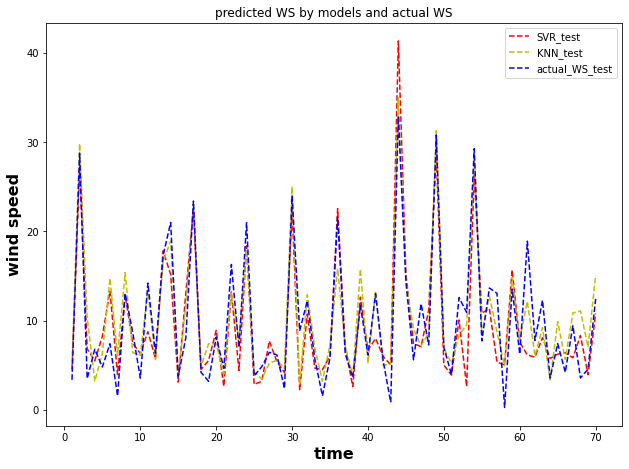

In [126]:
x=np.linspace(1,70,70)
y_svr= plt.figure(figsize=(10,7))
axes= y_svr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_svr_model[0:70,],'r--',label='SVR_test')
axes.plot(x,y_predicted_test_knn_model[0:70,],'y--',label='KNN_test')
axes.set_title('predicted WS by models and actual WS')
plt.plot(x,y_test[0:70,],'b--',label='actual_WS_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

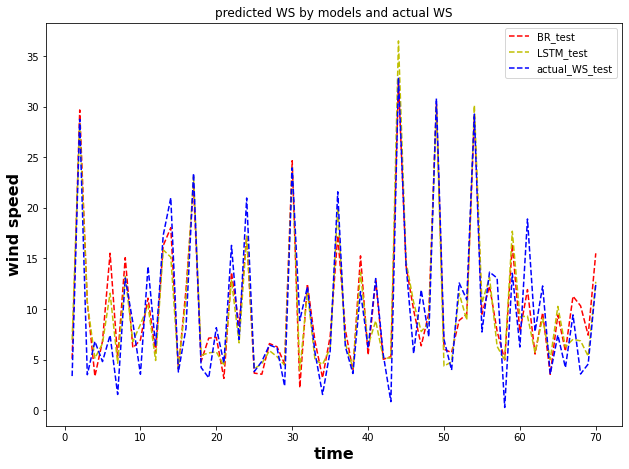

In [127]:
x=np.linspace(1,70,70)
y_svr= plt.figure(figsize=(10,7))
axes= y_svr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_b_model[0:70,],'r--',label='BR_test')
axes.plot(x,y_predicted_test_lstm_model[0:70,],'y--',label='LSTM_test')
axes.set_title('predicted WS by models and actual WS')
plt.plot(x,y_test[0:70,],'b--',label='actual_WS_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

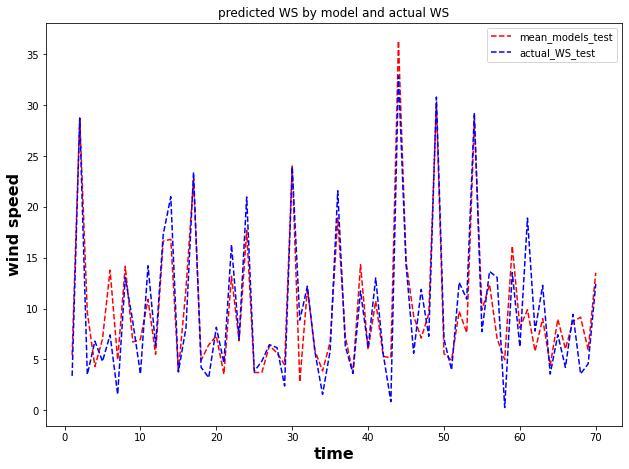

In [129]:
x=np.linspace(1,70,70)
y_svr= plt.figure(figsize=(10,7))
axes= y_svr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_mean_tested_model[0:70,],'r--',label='mean_models_test')
axes.set_title('predicted WS by model and actual WS')
plt.plot(x,y_test[0:70,],'b--',label='actual_WS_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

**ploting figures**

Training plot

In [ ]:
x=np.linspace(1,3395,3394)

In [ ]:
y_lr= plt.figure(figsize=(900,5))
axes= y_lr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_lr_model,'r--',label='y_predicted_train_lr_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_lr_poly= plt.figure(figsize=(900,5))
axes= y_lr_poly.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_lr_poly_model,'r--',label='y_predicted_train_lr_poly_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_knn= plt.figure(figsize=(900,5))
axes= y_knn.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_knn_model,'r--',label='y_predicted_train_knn_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_dt= plt.figure(figsize=(900,5))
axes= y_dt.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_dt_model,'r--',label='y_predicted_train_dt_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_svr= plt.figure(figsize=(900,5))
axes= y_svr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_svr_model,'r--',label='y_predicted_train_svr_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_b= plt.figure(figsize=(900,5))
axes= y_b.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_b_model,'r--',label='y_predicted_train_b_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_ann= plt.figure(figsize=(900,5))
axes= y_ann.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_ann_model,'r--',label='y_predicted_train_ann_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_cnn= plt.figure(figsize=(900,5))
axes= y_cnn.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_cnn_model,'r--',label='y_predicted_train_cnn_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
y_lstm= plt.figure(figsize=(900,5))
axes= y_lstm.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_train_lstm_model,'r--',label='y_predicted_train_lstm_model')
plt.plot(x,y_train,'b--',label='y_train')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

Testing plot

In [ ]:
x=np.linspace(1,850,849)

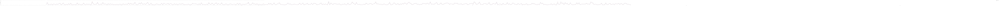

In [ ]:
y_lr= plt.figure(figsize=(900,5))
axes= y_lr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_lr_model,'r--',label='y_predicted_test_lr_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

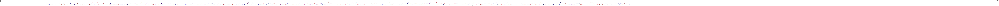

In [ ]:
y_lr_poly= plt.figure(figsize=(900,5))
axes= y_lr_poly.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_lr_poly_model,'r--',label='y_predicted_train_lr_poly_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

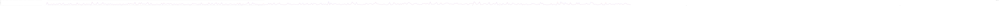

In [ ]:
y_knn= plt.figure(figsize=(900,5))
axes= y_knn.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_knn_model,'r--',label='y_predicted_test_knn_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

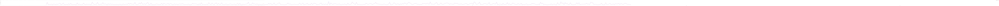

In [ ]:
y_dt= plt.figure(figsize=(900,5))
axes= y_dt.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_dt_model,'r--',label='y_predicted_test_dt_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

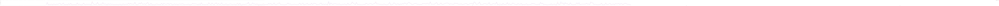

In [ ]:
y_svr= plt.figure(figsize=(900,5))
axes= y_svr.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_svr_model,'r--',label='y_predicted_test_svr_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

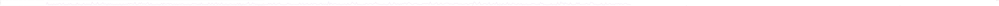

In [ ]:
y_b= plt.figure(figsize=(900,5))
axes= y_b.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_b_model,'r--',label='y_predicted_test_b_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

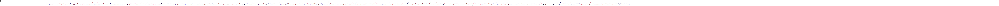

In [ ]:
y_ann= plt.figure(figsize=(900,5))
axes= y_ann.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_ann_model,'r--',label='y_predicted_test_ann_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

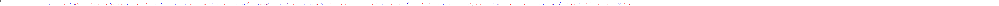

In [ ]:
y_cnn= plt.figure(figsize=(900,5))
axes= y_cnn.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_cnn_model,'r--',label='y_predicted_test_cnn_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()

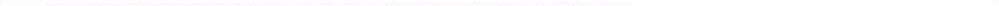

In [ ]:
y_lstm= plt.figure(figsize=(900,5))
axes= y_lstm.add_axes([0.1,0.1,0.8,0.8])
axes.plot(x,y_predicted_test_lstm_model,'r--',label='y_predicted_test_lstm_model')
plt.plot(x,y_test,'b--',label='y_test')
plt.legend()
plt.xlabel('time')
plt.ylabel('wind speed')
plt.show()